# Lab 12 - Training Deep Convolutional Neural Network
- Pongsakorn Jansanit, Student's 64070501033
- Peerapat Padtawaro, Student's 64070501039

Name your file to (first 2 student ID digit)_(last 4 student ID digit)*4.ipynb

## Lab Instruction

In this lab, you will learn to train a deep convolutional neural network using Keras library with Tensorflow backend. We will use  Cat vs Dog dataset.

See https://www.kaggle.com/c/dogs-vs-cats/data


### Your Turn! Dog or Cat Application

Now, it time to put everything together and develop and Cat vs Dog classifier model. Assume that you and your company want to get more attraction on your product by launching a new product that can classify whether it is a dog or a cat. You have decide that you want a precision more than 90 - 95% in order to launch to product.

You have a cat and dog dataset contain total of 25000 images, 12500 for cat and other half for a dog.

After successfully develop this model, you can try to play with it to see how it perform. (You can upload your selfies image to see you are a dog or a cat)

Some note before start a project:
1. You have to load a data into a project using any method
**suggest**
   

```
 !wget -c https://s3.amazonaws.com/content.udacity-data.com/nd089/Cat_Dog_data.zip
 !unzip -qq Cat_Dog_data.zip
```


2. You have to plan on how you will split a data. (or no need for suggest method)
3. You have to preprocess your data before feed into a network. For example, cropping, padding, etc.
4. You can come up with any model or use pre-train model. It depend on you!

You have two week for this project so that you can compete with your competitor app! Now, create a new Jupyter notebook and start building a model!

In [ ]:
!pip install --upgrade keras

In [ ]:
from tensorflow import keras
from keras import models
from keras import layers
from keras import optimizers
from keras import callbacks
from keras import backend as K
from keras.preprocessing import image
from keras.datasets import fashion_mnist
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import MaxPooling2D
%matplotlib inline

In [ ]:
# %load _utils
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
from keras import backend as K

# Test
def print_hello():
    print('Hello')

# define a function to plot the result from training step
def show_result(history):

    # Print the result from the last epoch
    print('Last train accuracy: %s'%history.history['acc'][-1])
    print('Last validation accuracy: %s'%history.history['val_acc'][-1])

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    acc = history.history['acc']
    val_acc = history.history['val_acc']

    epochs = range(1, len(loss) + 1)

    # Define a subplot
    fig, axs = plt.subplots(1,2,figsize=(15,4))

    # Plot loss
    loss_plot = axs[0]

    loss_plot.plot(epochs, loss, 'c--', label='Training loss')
    loss_plot.plot(epochs, val_loss, 'b', label='Validation loss')
    loss_plot.set_title('Training and validation loss')
    loss_plot.set_xlabel('Epochs')
    loss_plot.set_ylabel('Loss')
    loss_plot.legend()

    # Plot accuracy
    acc_plot = axs[1]

    acc_plot.plot(epochs, acc, 'c--', label='Training acc')
    acc_plot.plot(epochs, val_acc, 'b', label='Validation acc')
    acc_plot.set_title('Training and validation accuracy')
    acc_plot.set_xlabel('Epochs')
    acc_plot.set_ylabel('Accuracy')
    acc_plot.legend()

# Define an evaluation function to print the evaluation result
def evaluation_report(model,features,labels):

    # Calculate result
    result = model.evaluate(features,labels,verbose=False)

    # Predict and convert into a class
    pred_class = model.predict(features).argmax(axis=1)
    labels = labels.argmax(axis=1)
    # Show report
    print(confusion_matrix(labels,pred_class))
    print(classification_report(labels,pred_class))
    print("Loss: %s Accuracy: %s" %(result[0],result[1]))

    return pred_class


# Show a subplot of the incorrect predict data
def show_false_prediction(predict, feature, label, img_size=28, channel=1):

    false_pred = feature[(predict != label).tolist()]
    actual_label = label[(predict != label).tolist()]
    false_label = predict[(predict != label).tolist()]
    if channel == 3:
        false_pred = false_pred.reshape(false_pred.shape[0],img_size,img_size,channel)
    elif channel == 1:
        false_pred = false_pred.reshape(false_pred.shape[0],img_size,img_size)
    else:
        raise ValueError('Must be RGB or gray scale image')

    print(false_pred.shape)

    fig, ax = plt.subplots(3,10,figsize=(15,6))
    fig.suptitle('The incorrect prediction')

    for i in range(3):
        for j in range(10):
            ax[i,j].imshow(false_pred[j + i*10],cmap='gray')
            ax[i,j].set_title('Pred %s Act %s'%(false_label[j + i*10],actual_label[j + i*10]))

# Show activation value of each layer
def show_layer_activation(activation, model,num_layer,num_row=16):
    layer_names = []
    for layer in model.layers[:num_layer]:
        layer_names.append(layer.name)

    images_per_row = num_row
    for layer_name, layer_activation in zip(layer_names,activation):
        n_features = layer_activation.shape[-1]

        size = layer_activation.shape[1]

        n_cols = n_features//images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))

        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,:,:,col*images_per_row + row]
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0,255).astype('uint8')
                display_grid[col*size:(col +1)*size,
                             row*size:(row+1)*size] = channel_image
        scale = 1./size
        plt.figure(figsize=(scale*display_grid.shape[1],
                           scale*display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')


def deprocess_image(img):

    # Zero-centering and make sure that std is 0.1
    img -= img.mean()
    img /= (img.std() + 1e-5)
    img *= 0.1

    # Clips to [0,1]
    img += 0.5
    img = np.clip(img,0,1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img,0,255).astype('uint8')

    return img

def generate_pattern(model, layer_name , filter_index, size=150):
    # Build the loss function that maximize the activation of the nth filter of the layer under consideration
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:,:,:,filter_index])

    # Compute the gradient of the input picture with regard to this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) +1e-5)

    # Return the loss and gradient given the input picture
    iterate = K.function([model.input],[loss, grads])

    # Stars from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 step
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    return deprocess_image(img)

### feed layer name. ie, 'conv_1'
def visualize_filter(model,layer_name, size= 64, margin = 5):

    # Empty black image to store results
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    # iterate over the row of result grid
    for i in range(8):
        # Iterate over the column of the result grid
        for j in range(8):
            # Generates the pattern for filter i + (j*8) in layer_name
            filter_img = generate_pattern(model, layer_name, i + (j*8), size=size)

            # Puts the result in the square (i,j) of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start:horizontal_end,
                    vertical_start:vertical_end, :] = filter_img

    plt.figure(figsize=(20,20))
    plt.imshow(results)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# Load data

In [ ]:
!sudo apt-get install wget unzip

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
wget is already the newest version (1.21.2-2ubuntu1).
unzip is already the newest version (6.0-26ubuntu3.1).
0 upgraded, 0 newly installed, 0 to remove and 10 not upgraded.


In [ ]:
# Download the zip file
!wget -c https://s3.amazonaws.com/content.udacity-data.com/nd089/Cat_Dog_data.zip

# Unzip the file
!unzip -qq Cat_Dog_data.zip

--2023-11-25 12:41:48--  https://s3.amazonaws.com/content.udacity-data.com/nd089/Cat_Dog_data.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 16.182.67.216, 52.216.49.224, 16.182.74.56, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|16.182.67.216|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

replace Cat_Dog_data/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [ ]:
train_data_dir = '/content/Cat_Dog_data/train'
test_data_dir = '/content/Cat_Dog_data/test'

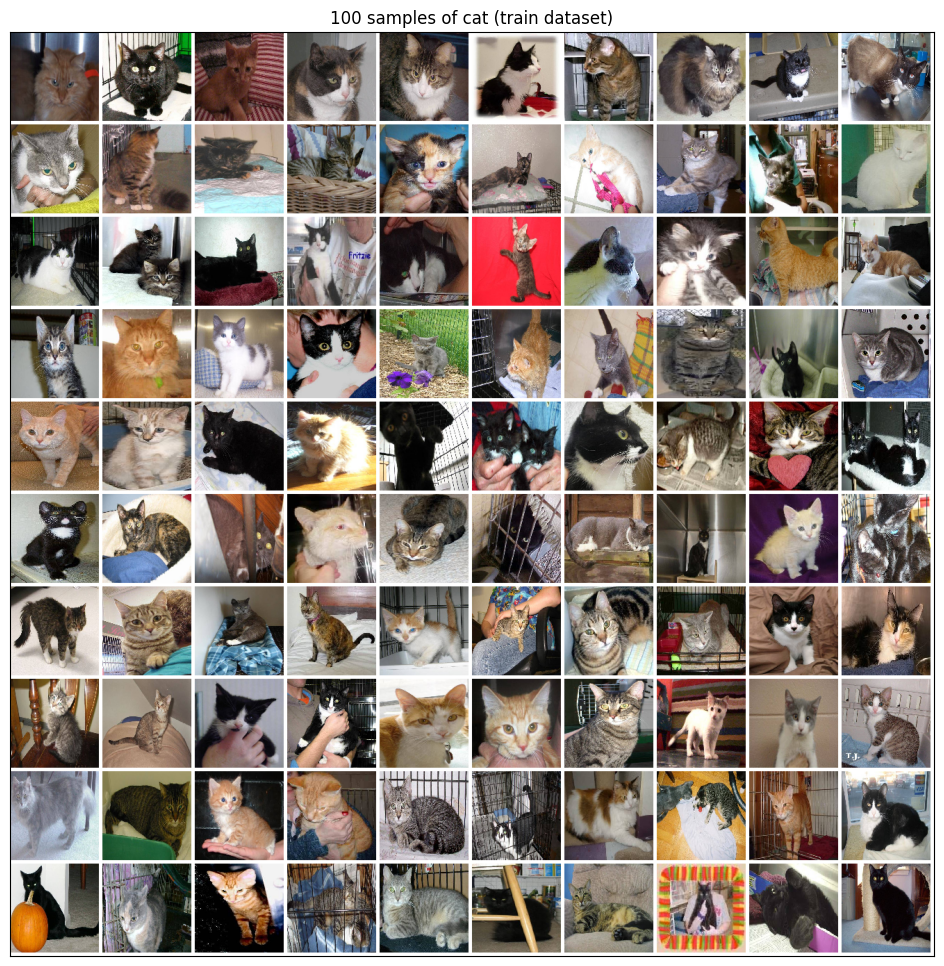

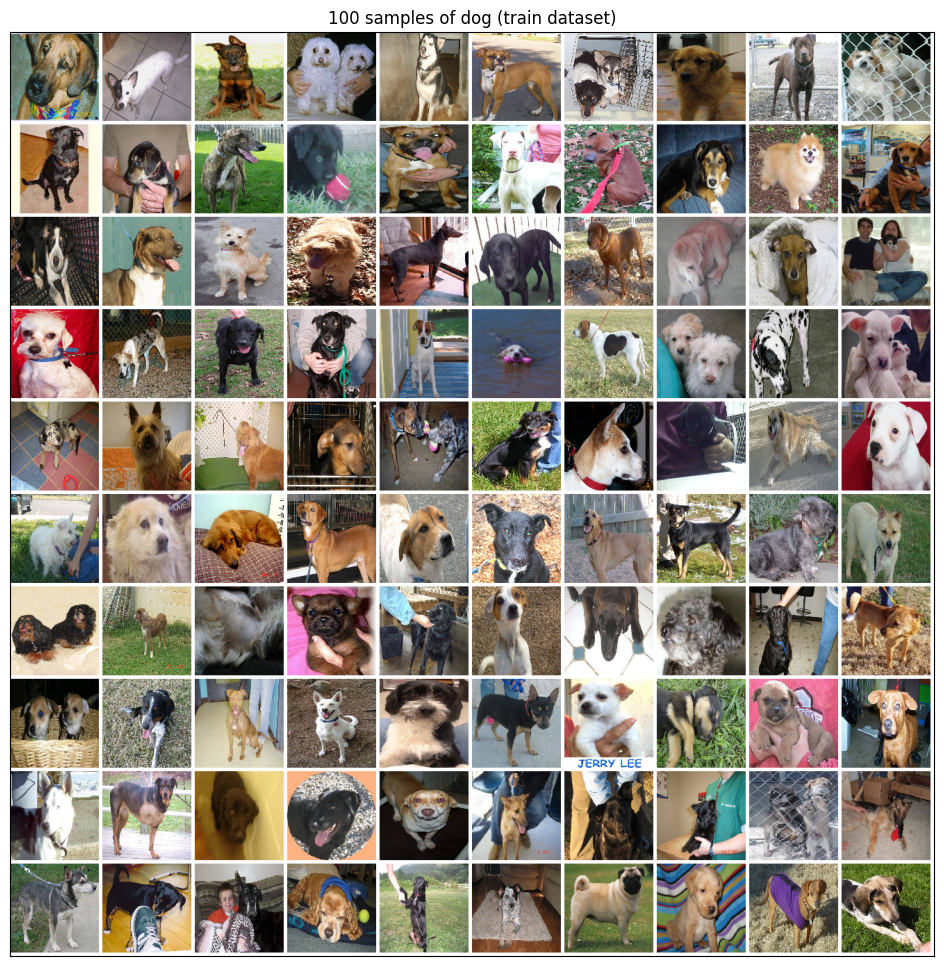

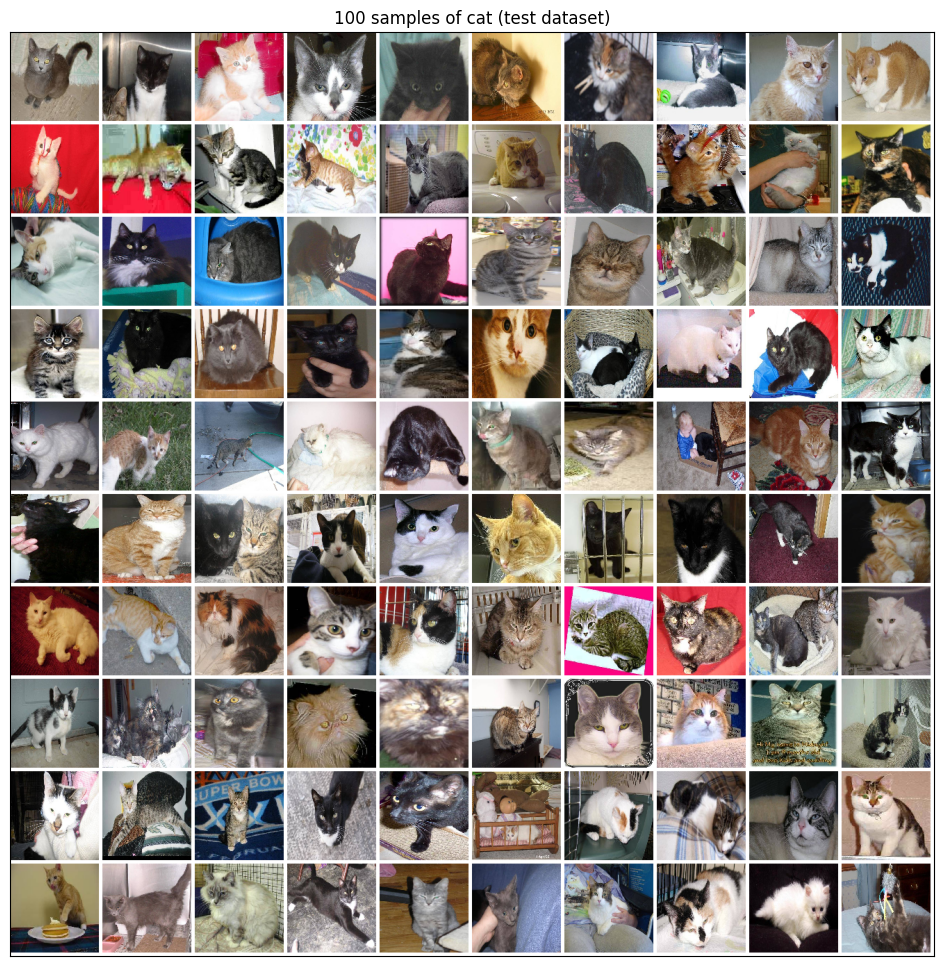

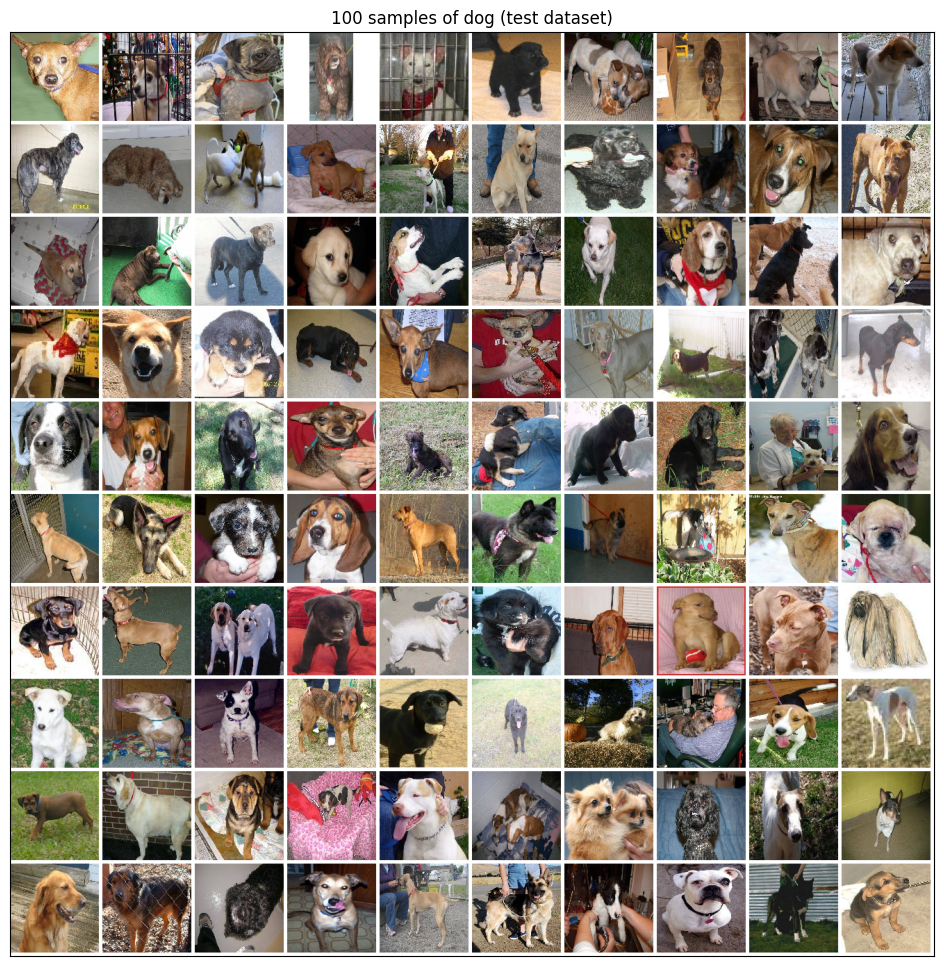

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img, img_to_array

def get_side(img, side_type, side_size=5):
    height, width, channel = img.shape
    if side_type == "horizontal":
        return np.ones((height, side_size, channel), dtype=np.float32) * 255

    return np.ones((side_size, width, channel), dtype=np.float32) * 255

def show_gallery(category_dir, dataset_type, num_samples=100, width=128, height=128):
    counter = 0
    images = list()
    vertical_images = []

    # Get a list of image files in the specified category directory
    all_files = [os.path.join(category_dir, file) for file in os.listdir(category_dir)]

    # Set a seed for reproducibility
    np.random.seed(42)
    np.random.shuffle(all_files)

    for path in all_files:
        counter += 1

        # Image loading from disk as JpegImageFile file format
        img = load_img(path, target_size=(width, height))
        # Converting JpegImageFile to numpy array
        img = img_to_array(img)

        hside = get_side(img, side_type="horizontal")
        images.append(img)
        images.append(hside)

        if counter % 10 == 0:
            himage = np.hstack(images)
            vside = get_side(himage, side_type="vertical")
            vertical_images.append(himage)
            vertical_images.append(vside)

            images = []

        if counter == num_samples:
            break

    gallery = np.vstack(vertical_images)
    plt.figure(figsize=(12, 12))
    plt.xticks([])
    plt.yticks([])
    plt.title(f"100 samples of {os.path.basename(category_dir)} ({dataset_type} dataset)")
    plt.imshow(gallery.astype(np.uint8))
    plt.show()

# Show gallery for the cat category in the training data
show_gallery(os.path.join(train_data_dir, 'cat'), dataset_type='train', num_samples=100, width=128, height=128)
show_gallery(os.path.join(train_data_dir, 'dog'), dataset_type='train', num_samples=100, width=128, height=128)
show_gallery(os.path.join(test_data_dir, 'cat'), dataset_type='test', num_samples=100, width=128, height=128)
show_gallery(os.path.join(test_data_dir, 'dog'), dataset_type='test', num_samples=100, width=128, height=128)


# Data Preprocessing

In [ ]:
# Import libraries and modules
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import MobileNetV2
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.models import Model
from keras.optimizers import Adam

In [ ]:
# Data preprocessing and augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.2,1.0],
    fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

# Image size for the model
img_size = (224, 224)

# Train-validation split
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=img_size,
    batch_size=32,
    class_mode='binary')

# Train-validation split
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=img_size,
    batch_size=32,
    class_mode='binary',
    shuffle=False)

# Load the MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_size[0], img_size[1], 3))

Found 22500 images belonging to 2 classes.
Found 2500 images belonging to 2 classes.


# Prepare The Model

In [ ]:
# Freeze the base_model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(1, activation='sigmoid')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

In [ ]:
 # Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'], run_eagerly=True)

In [ ]:
# Train the model
history = model.fit_generator(
    train_generator,
    steps_per_epoch=100,
    epochs=10,
    validation_data=test_generator,
    validation_steps=50)

<ipython-input-25-5c1f60daad1a>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/10
100/100 [==============================] - 787s 8s/step - loss: 0.2807 - accuracy: 0.8725 - val_loss: 0.0510 - val_accuracy: 0.9869
Epoch 2/10
100/100 [==============================] - 765s 8s/step - loss: 0.1243 - accuracy: 0.9522 - val_loss: 0.0593 - val_accuracy: 0.9844
Epoch 3/10
100/100 [==============================] - 776s 8s/step - loss: 0.1066 - accuracy: 0.9594 - val_loss: 0.0753 - val_accuracy: 0.9819
Epoch 4/10
100/100 [==============================] - 771s 8s/step - loss: 0.0864 - accuracy: 0.9684 - val_loss: 0.0461 - val_accuracy: 0.9875
Epoch 5/10
100/100 [==============================] - 756s 8s/step - loss: 0.0837 - accuracy: 0.9682 - val_loss: 0.0691 - val_accuracy: 0.9837
Epoch 6/10
100/100 [==============================] - 776s 8s/step - loss: 0.0893 - accuracy: 0.9672 - val_loss: 0.0636 - val_accuracy: 0.9850
Epoch 7/10
100/100 [==============================] - 772s 8s/step - loss: 0.0766 - accuracy: 0.9694 - val_loss: 0.0814 - val_accuracy: 0.9831

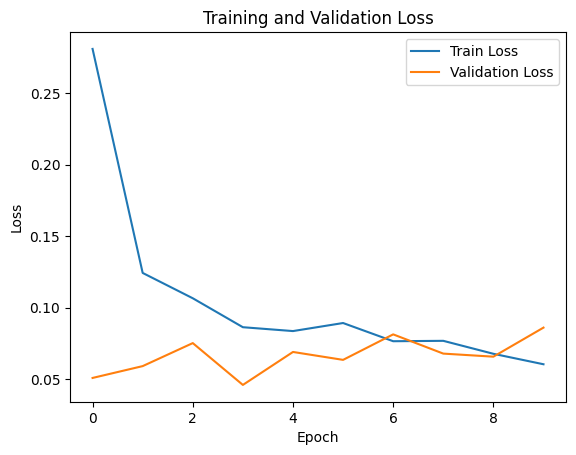

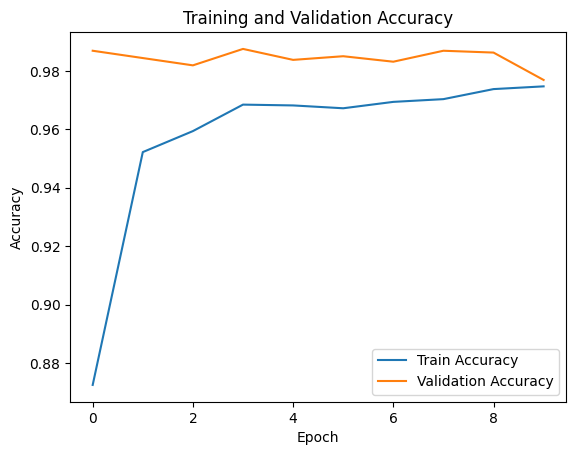

Last train accuracy: 0.9746875166893005
Last validation accuracy: 0.9768750071525574


In [ ]:
show_result(history)

# Evaluate The Model

In [ ]:
# Model evaluation
evaluation = model.evaluate(test_generator)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

79/79 [==============================] - 118s 2s/step - loss: 0.2100 - accuracy: 0.9584
Test Loss: 0.210021510720253
Test Accuracy: 0.9584000110626221


1/1 [==============================] - 0s 259ms/step


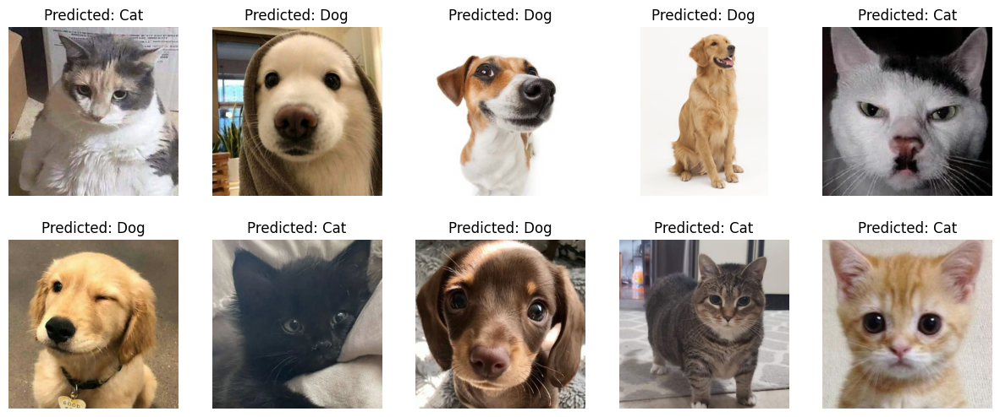

In [ ]:
test_dir = '/content/drive/MyDrive/CNN/Test'

# Function to preprocess an image for prediction
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Rescale to [0, 1]
    return img_array

# Get a list of image files in the test directory
test_files = [os.path.join(test_dir, file) for file in os.listdir(test_dir)]

# Plot 10 images with predicted labels
plt.figure(figsize=(15, 6))
for i in range(10):
    img_path = test_files[i]
    img_array = preprocess_image(img_path, target_size=(224, 224))
    prediction = model.predict(img_array)
    predicted_label = "Dog" if prediction > 0.5 else "Cat"

    plt.subplot(2, 5, i + 1)
    plt.imshow(image.load_img(img_path))
    plt.title(f"Predicted: {predicted_label}")
    plt.axis("off")

plt.show()

1/1 [==============================] - 0s 356ms/step


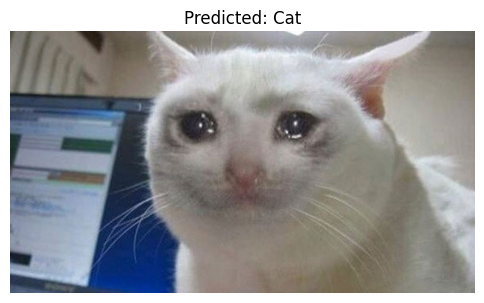

In [109]:
image_path = '/content/drive/MyDrive/CNN/Test/Frame 13.jpg'
image_array = preprocess_image(image_path, target_size=(224, 224))

# Predict the label
prediction = model.predict(image_array)
predicted_label = "Dog" if prediction > 0.5 else "Cat"

# Display the image and predicted label
plt.figure(figsize=(6, 6))
plt.imshow(image.load_img(image_path))
plt.title(f"Predicted: {predicted_label}")
plt.axis("off")
plt.show()